# **1. 데이터, yolov5 다운로드**

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -r requirements.txt  # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v6.2-109-g23701ea Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 38.1/166.8 GB disk)


만들어둔 트레인 데이터 압축파일 업로드 후
압축해제

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip -q ../train_data.zip -d ../

coco128.yaml 다운로드 및 수정 -> custom_data.yaml

In [ ]:
%cd /content/yolov5/data
%cat custom_data.yaml

/content/yolov5/data
# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
train: ../train_data/images/train/  # train images (relative to 'path') 128 images
val: ../train_data/images/val/  # val images (relative to 'path') 128 images


# Classes
nc: 25  # number of classes
names: ['top_half_Tshirts',
'top_half_pk',
'top_half_shirts',
'top_half_blouse',
'top_half_knit',
'top_long_Tshirts',
'top_long_pk',
'top_long_shirts',
'top_long_blouse',
'top_long_knit',
'top_hood',
'top_mtm',
'top_sleeveless',
'bot_cot',
'bot_cot_half',
'bot_denim',
'bot_denim_half',
'bot_slax',
'bot_jogger',
'bot_trainning',
'bot_leggings',
'bot_skirt_mini',
'bot_skirt_long',
'onepiece',
'bot_skirt_midi']  # class names




In [ ]:
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml
# parameters
nc: 25  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
%cd /content/yolov5

/content/yolov5


In [ ]:
!python train.py --img 640 --batch 16 --epochs 100 --data custom_data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --cache  

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=custom_data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-109-g23701ea Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.

## 이미지 테스트

In [ ]:
!python detect.py --weights runs/train/exp2/weights/best.pt --img 640 --conf 0.3 --source ../test_image2/

detect: weights=['runs/train/exp2/weights/best.pt'], source=../test_image2/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-109-g23701ea Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7077550 parameters, 0 gradients, 16.0 GFLOPs
image 1/18 /content/test_image2/1.jpg: 640x448 1 top_long_blouse, 1 bot_trainning, 10.2ms
image 2/18 /content/test_image2/10.jpg: 640x448 1 top_mtm, 1 bot_leggings, 7.0ms
image 3/18 /content/test_image2/11.jpg: 640x352 1 top_half_Tshirts, 1 bot_leggings, 10.4ms
image 4/18 /content/test_image2/12.jpg: 640x416 1 bot_cot_half, 11.5ms
ima

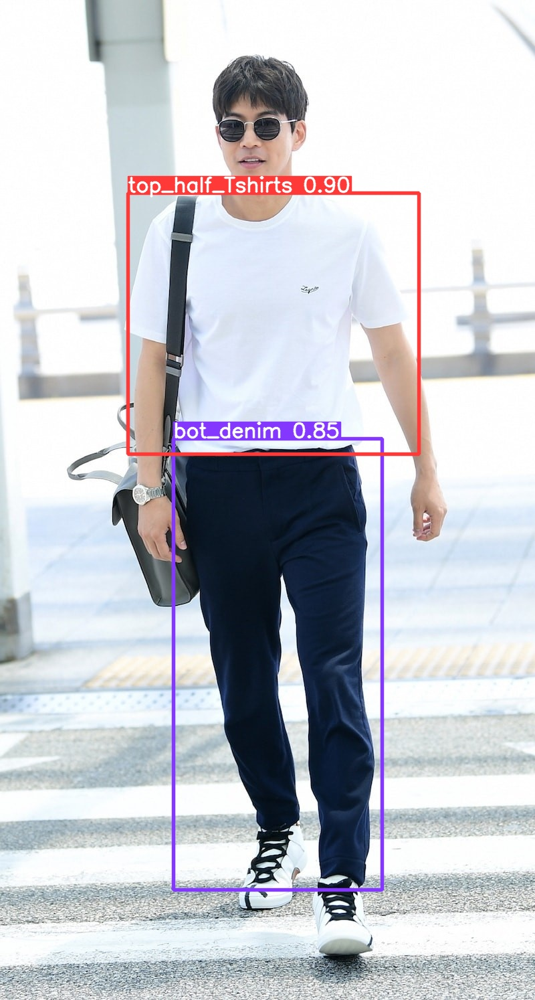

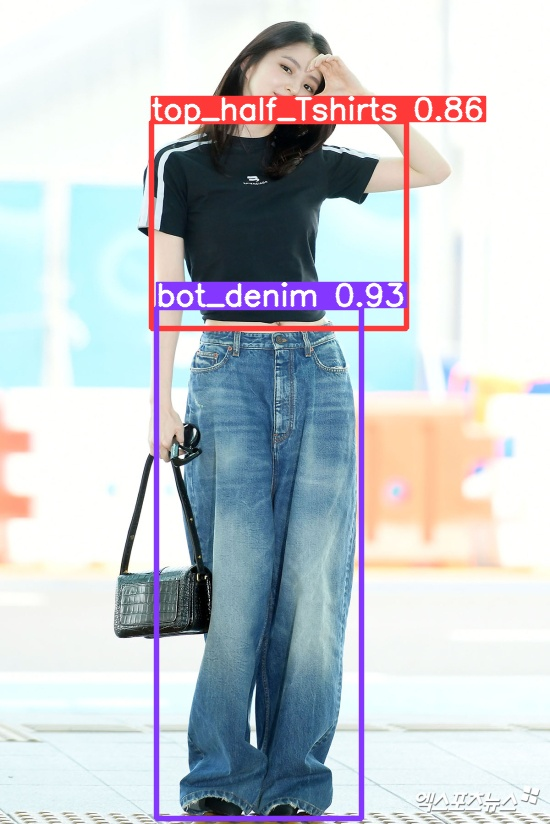

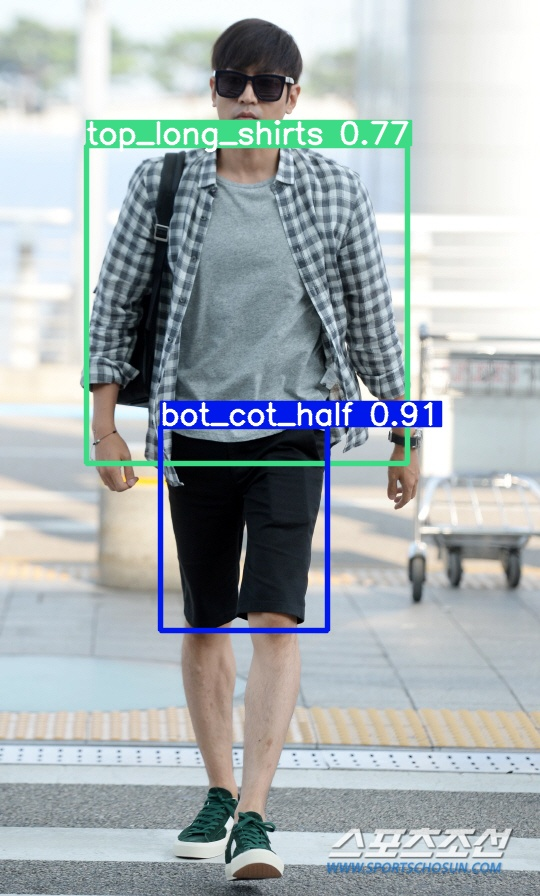

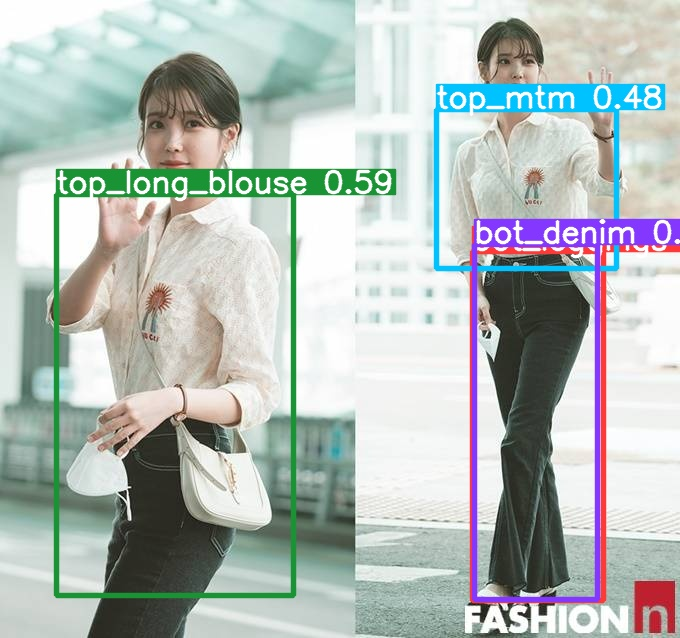

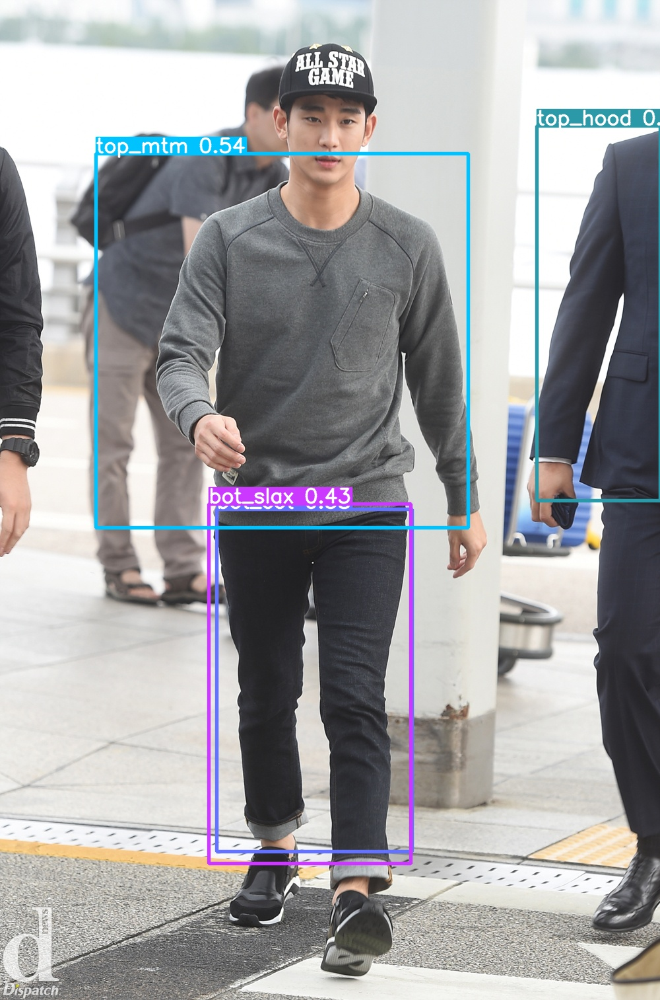

...

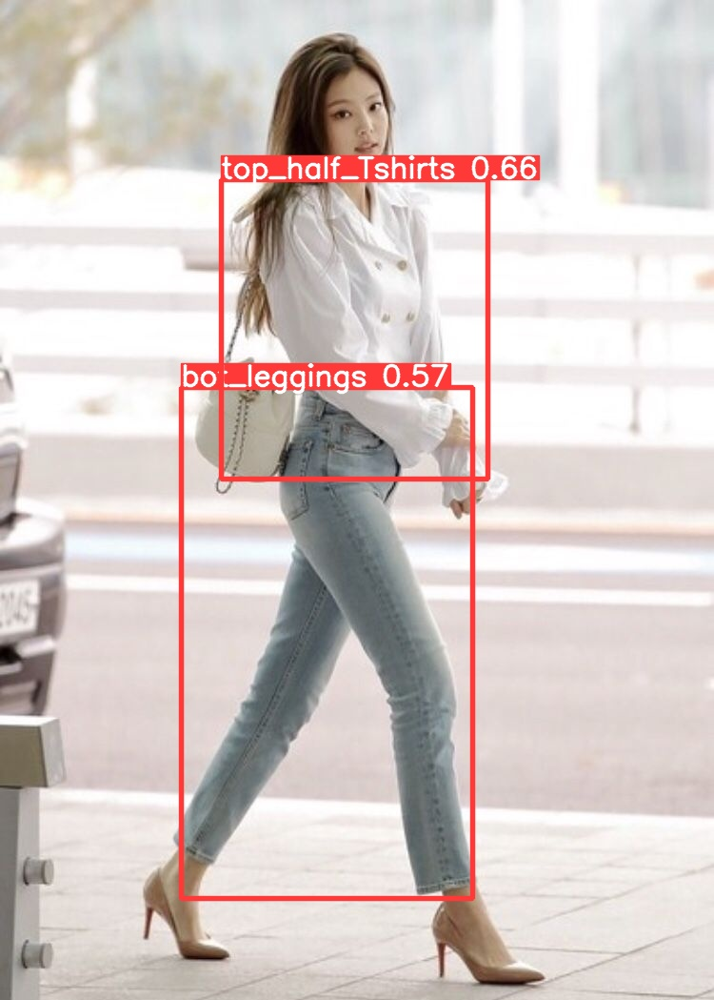

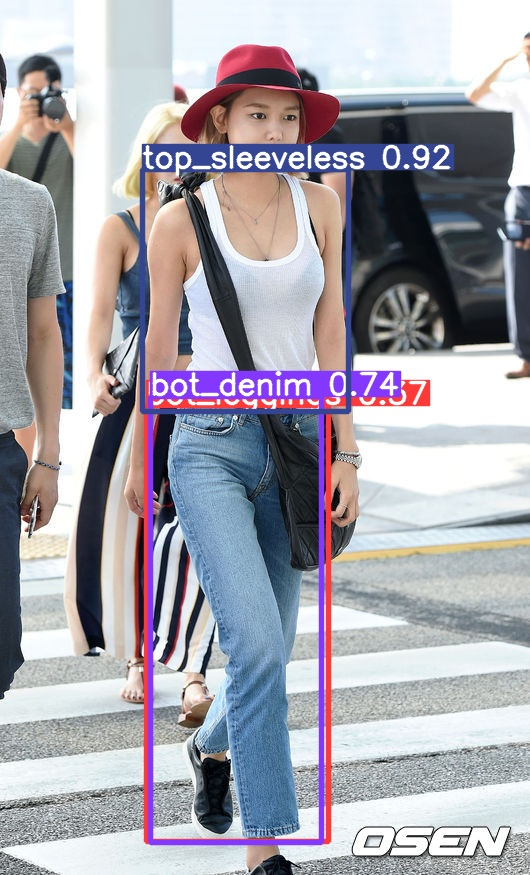

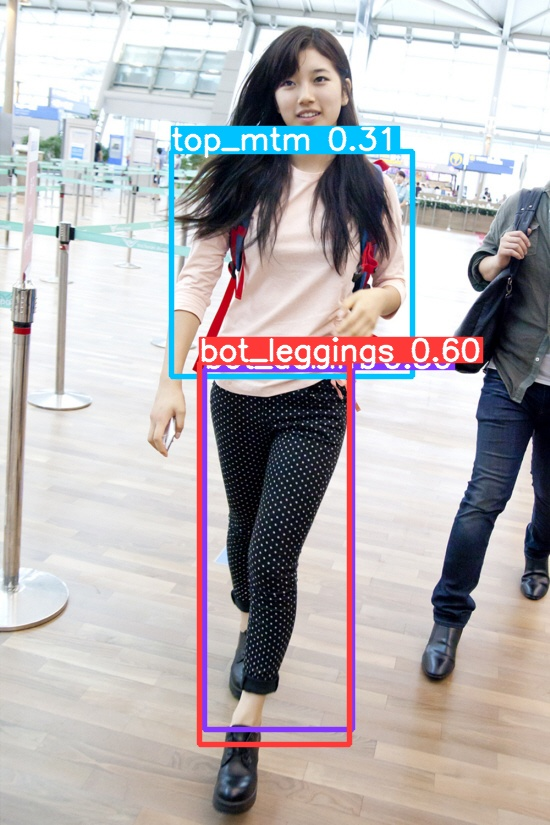

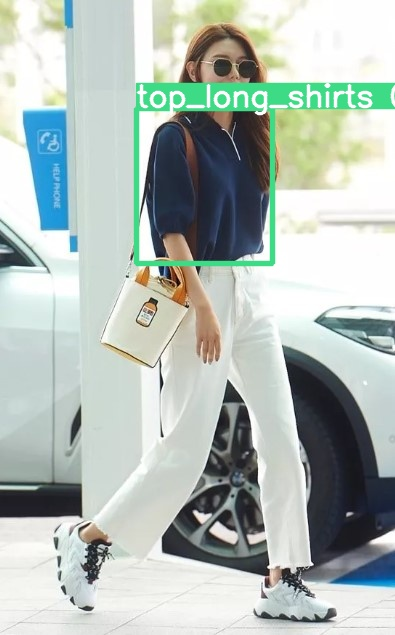

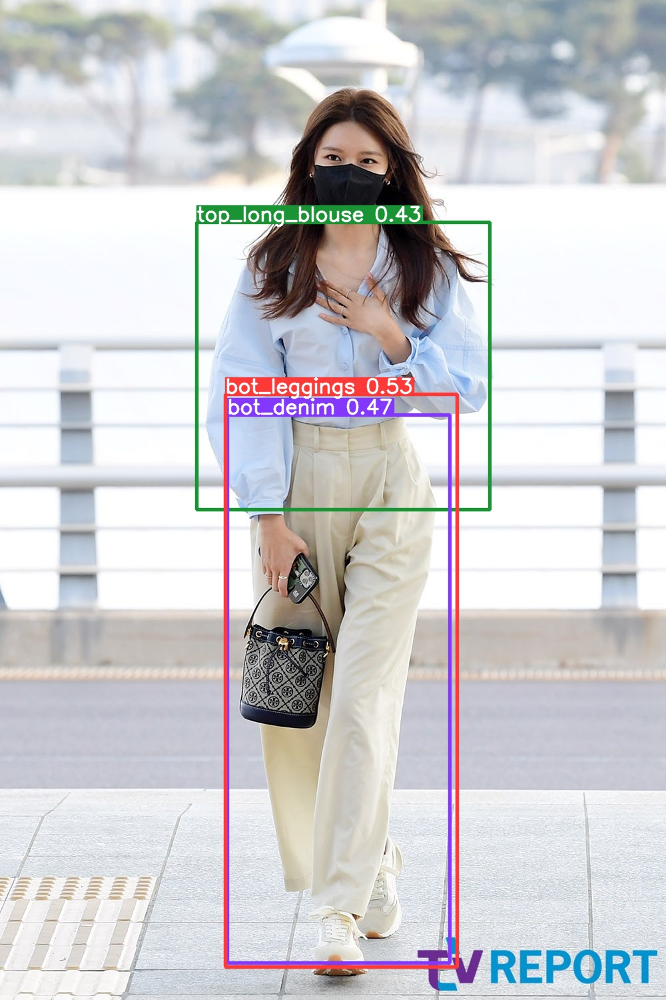

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp5/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

## 모델 export

In [ ]:
!python export.py --weights runs/train/exp/weights/best.pt --include tflite

export: data=data/coco128.yaml, weights=['runs/train/exp/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, train=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tflite']
YOLOv5 🚀 v6.2-99-g3cd66b1 Python-3.7.13 torch-1.12.1+cu113 CPU

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7311246 parameters, 0 gradients

PyTorch: starting from runs/train/exp/weights/best.pt with output shape (1, 25200, 30) (14.3 MB)

TensorFlow SavedModel: starting export with tensorflow 2.8.2...

                 from  n    params  module                                  arguments                     
  0                -1  1      3520  models.common.Focus                     [3, 32, 3]                    
2022-09-09 02:08:29.911555: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] fai

In [ ]:
model = torch.hub.load('ultralytics/yolov5', 'custom', 'runs/train/exp/weights/best-fp16.tflite')

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v6.2-99-g3cd66b1 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Loading runs/train/exp/weights/best-fp16.tflite for TensorFlow Lite inference...
Adding AutoShape... 


In [ ]:
model = torch.hub.load('ultralytics/yolov5', 'custom', 'runs/train/exp/weights/best.pt')

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v6.2-99-g3cd66b1 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7311246 parameters, 0 gradients
Adding AutoShape... 


In [ ]:
img = ['/content/test_image2/11.jpg']
results = model(img)
results.pandas().xyxy[0]

,xmin,ymin,xmax,ymax,confidence,class,name
0,163.346298,287.114685,627.292236,686.185425,0.932403,0,class0
1,273.639618,668.885315,560.087280,1306.031128,0.928767,15,class15


In [ ]:
img = ['/content/test_image2/11.jpg']
results = model(img)
results.pandas().xyxy[0]

,xmin,ymin,xmax,ymax,confidence,class,name
0,175.399094,284.361816,617.947083,684.309937,0.929339,0,top_half_Tshirts
1,271.830078,665.797180,580.969177,1305.359009,0.920038,15,bot_denim


## 텐서보드

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 931), started 1:14:46 ago. (Use '!kill 931' to kill it.)

<IPython.core.display.Javascript object>